In [6]:
model_state_dict = "../../slurm/runs/Comparion_RPI/RPINet/model_epoch17"

In [7]:
from RNARepLearn.datasets import CombinedRfamDataset
from RNARepLearn.utils import train_val_test_loaders, add_backbone
from RNARepLearn.train import MaskedTraining
from RNARepLearn.models import Encoder_Decoder_Model, Seq_Struc_GNN, CombinedGNN
from RNARepLearn.layers import Sep_Seq_Struc_Layer
from RNARepLearn.modules import CNN_Seq, RPINetEncoder, pooling_layer, AttentionDecoder
import torch
from torch_geometric.nn import GCNConv, global_add_pool
from torch_geometric.transforms import AddLaplacianEigenvectorPE
from torch_geometric.utils import to_dense_batch
from torch_geometric.loader import DataLoader
import itertools

In [8]:
ds = CombinedRfamDataset("/lustre/groups/crna01/workspace/nicolas_msc/RNARepLearn/rfam/data/raw/processed/release-14.8", None ,"All_300", sample_rfams = ["RF00001","RF00005","RF00026", "RF00003","RF00017"])
ds

Processing...


Processing complete


Done!


CombinedRfamDataset(24520)

In [9]:
with open("/".join(model_state_dict.split("/")[:-1])+"/gin.config", "r") as f:
    for line in f.readlines():
        print(line)

## Setup Dataset + Training || Choose Decoder

command_line.setup_data.dataset_type = "RFAM"

command_line.setup_data.basepath = "/lustre/groups/crna01/workspace/nicolas_msc/RNARepLearn/rfam/data/raw/processed/release-14.8"

command_line.setup_data.dataset_name = "All_300"

command_line.setup_data.train_val_test_splits = [0.8,0.1,0.1] #set val to 0 to skip validation

command_line.train.mode = "masked"

command_line.train.encoder = @RNARepLearn.modules.RPINetEncoder

command_line.train.decoder = @AttentionDecoder

command_line.train.masked_percentage = 15

command_line.train.n_epochs = 100

command_line.setup_data.batch_size = 64





## Decoder related configs

modules.RPINetEncoder.input_channels = 4

modules.RPINetEncoder.output_channels = 64

modules.RPINetEncoder.n_layers = 3

modules.RPINetEncoder.conv_kernel_size = 9



## Setup Model dimensions

modules.AttentionDecoder.input_channels = 128

modules.AttentionDecoder.output_channels = 4



## only needed for RPINet, due to bidir

In [4]:
test = DataLoader(ds, 64)

In [5]:
model = Encoder_Decoder_Model(encoder=RPINetEncoder(4,64,3,9),decoder=AttentionDecoder(128,4))
model.load_state_dict(torch.load(model_state_dict, map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu')))

<All keys matched successfully>

In [ ]:
rpi = next(model.model.children())
layers = [rpi, pooling_layer(global_add_pool)]
model = torch.nn.Sequential(*layers)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

node_embeddings = []
ids = []
with torch.no_grad():
    for i,batch in enumerate(test):
        batch.to(device)

        out = model(batch)
        node_embeddings.append(out.x.cpu())
        ids.append(out.rfam)

        if(i % 50 == 0):
            print("Step "+str(i)+"/"+str(len(test)))

RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx

In [29]:
node_embeddings = torch.cat(node_embeddings, dim=0)

TypeError: cat() received an invalid combination of arguments - got (Tensor, dim=int), but expected one of:
 * (tuple of Tensors tensors, int dim, *, Tensor out)
 * (tuple of Tensors tensors, name dim, *, Tensor out)


In [ ]:
ids = list(itertools.chain.from_iterable(ids))

In [30]:
uniq_ids = set(ids)
len(uniq_ids)

5

In [32]:
from sklearn.decomposition import PCA #Principal Component Analysis
from sklearn.manifold import TSNE #T-Distributed Stochastic Neighbor Embedding
from sklearn.cluster import KMeans #K-Means Clustering
from sklearn.preprocessing import StandardScaler

In [33]:
kmeans = KMeans(n_clusters=len(uniq_ids))

In [34]:
emb = node_embeddings.detach().numpy()

In [35]:
scaler = StandardScaler()

In [36]:
emb = scaler.fit_transform(emb)

In [37]:
kmeans.fit(emb)

KMeans(n_clusters=5)

In [38]:
pred = kmeans.predict(emb)

In [39]:
pca_1d = PCA(n_components=1)

#PCA with two principal components
pca_2d = PCA(n_components=2)

#PCA with three principal components
pca_3d = PCA(n_components=3)

In [40]:
PCA_1D = pca_1d.fit_transform(emb)
PCA_2D = pca_2d.fit_transform(emb)
PCA_3D = pca_3d.fit_transform(emb)

In [41]:
import numpy as np
PC_values = np.arange(pca_1d.n_components_) + 1

In [42]:
import plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [43]:
groups = ["RF00001","RF00005","RF00026", "RF00003","RF00017"]

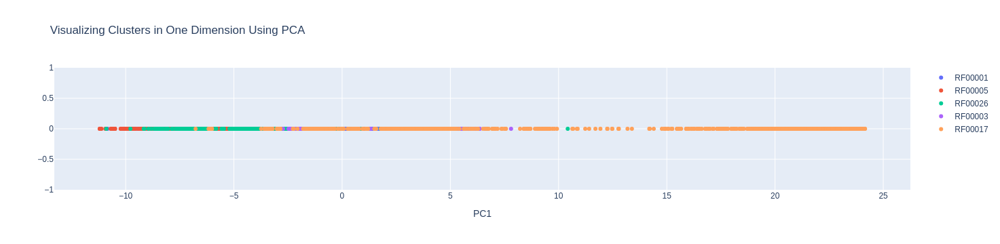

In [44]:
data = []
for group in groups:
    X = PCA_1D[[i for i, x in enumerate(ids) if x == group]]
    trace = go.Scatter(x = X.squeeze(1), y = [0 for i in ids if i == group], mode = "markers", name = group, text = None)
    data.append(trace)
    
title = "Visualizing Clusters in One Dimension Using PCA"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',zeroline= False),
              yaxis= dict(title= '',zeroline= False)
             )

fig = dict(data = data, layout = layout)

import plotly.io as pio
pio.renderers.default = 'jupyterlab'
iplot(fig)

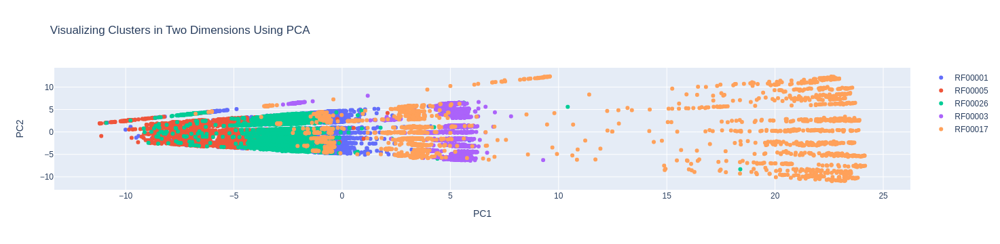

In [45]:
data = []
for group in groups:
    pca = PCA_2D[[i for i, x in enumerate(ids) if x == group]]
    X = [i[0] for i in pca]
    Y = [i[1] for i in pca]
    trace = go.Scatter(x = X, y = Y, mode = "markers", name = group, text = None)
    data.append(trace)
    
title = "Visualizing Clusters in Two Dimensions Using PCA"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',zeroline= False),
              yaxis= dict(title= 'PC2',zeroline= False)
             )

fig = dict(data = data, layout = layout)

import plotly.io as pio
pio.renderers.default = 'jupyterlab'
iplot(fig)

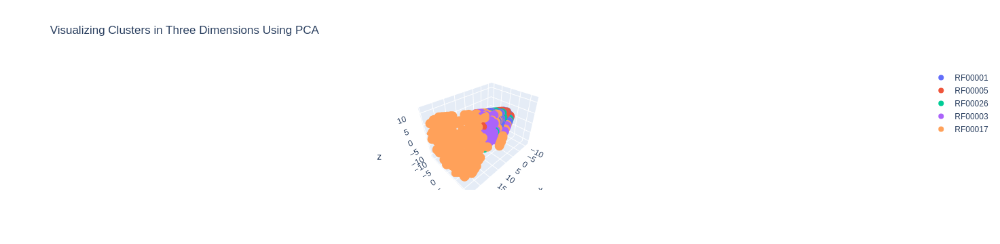

In [46]:
data = []
for group in groups:
    pca = PCA_3D[[i for i, x in enumerate(ids) if x == group]]
    X = [i[0] for i in pca]
    Y = [i[1] for i in pca]
    Z = [i[2] for i in pca]
    trace = go.Scatter3d(x = X, y = Y, z = Z, mode = "markers", name = group, text = None)
    data.append(trace)
    
title = "Visualizing Clusters in Three Dimensions Using PCA"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',zeroline= False),
              yaxis= dict(title= 'PC2',zeroline= False)
             )

fig = dict(data = data, layout = layout)

import plotly.io as pio
pio.renderers.default = 'jupyterlab'
iplot(fig)

In [49]:
#Set our perplexity
perplexity = 5

In [50]:
#T-SNE with one dimension
tsne_1d = TSNE(n_components=1, perplexity=perplexity)

#T-SNE with two dimensions
tsne_2d = TSNE(n_components=2, perplexity=perplexity)

#T-SNE with three dimensions
tsne_3d = TSNE(n_components=3, perplexity=perplexity)

In [51]:
#This DataFrame holds a single dimension,built by T-SNE
TCs_1d = tsne_1d.fit_transform(emb)

#This DataFrame contains two dimensions, built by T-SNE
TCs_2d = tsne_2d.fit_transform(emb)

#And this DataFrame contains three dimensions, built by T-SNE
TCs_3d = tsne_3d.fit_transform(emb)

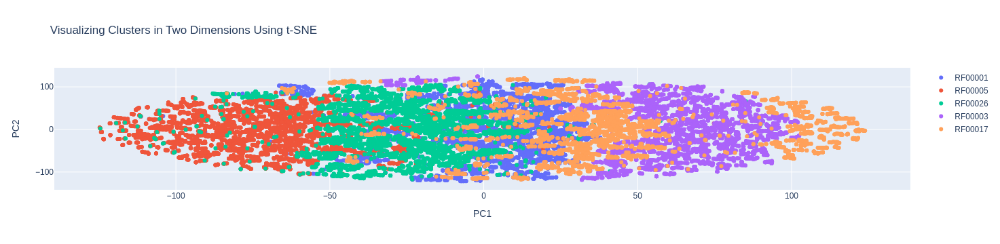

In [52]:
data = []
for group in groups:
    tcs = TCs_2d[[i for i, x in enumerate(ids) if x == group]]
    X = [i[0] for i in tcs]
    Y = [i[1] for i in tcs]
    trace = go.Scatter(x = X, y = Y, mode = "markers", name = group, text = None)
    data.append(trace)
    
title = "Visualizing Clusters in Two Dimensions Using t-SNE"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',zeroline= False),
              yaxis= dict(title= 'PC2',zeroline= False)
             )

fig = dict(data = data, layout = layout)

import plotly.io as pio
pio.renderers.default = 'jupyterlab'
iplot(fig)

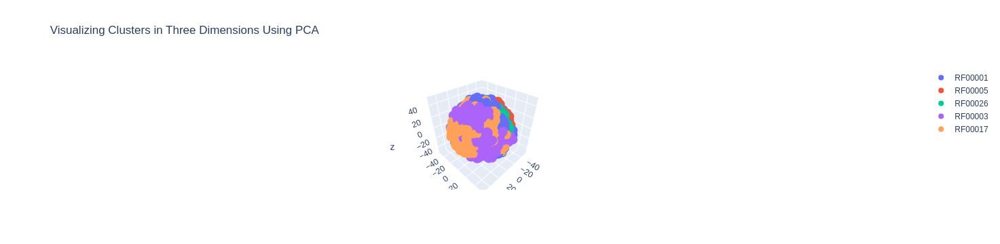

In [53]:
data = []
for group in groups:
    tcs = TCs_3d[[i for i, x in enumerate(ids) if x == group]]
    X = [i[0] for i in tcs]
    Y = [i[1] for i in tcs]
    Z = [i[2] for i in tcs]
    trace = go.Scatter3d(x = X, y = Y, z = Z, mode = "markers", name = group, text = None)
    data.append(trace)
    
title = "Visualizing Clusters in Three Dimensions Using PCA"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',zeroline= False),
              yaxis= dict(title= 'PC2',zeroline= False)
             )

fig = dict(data = data, layout = layout)

import plotly.io as pio
pio.renderers.default = 'jupyterlab'
iplot(fig)

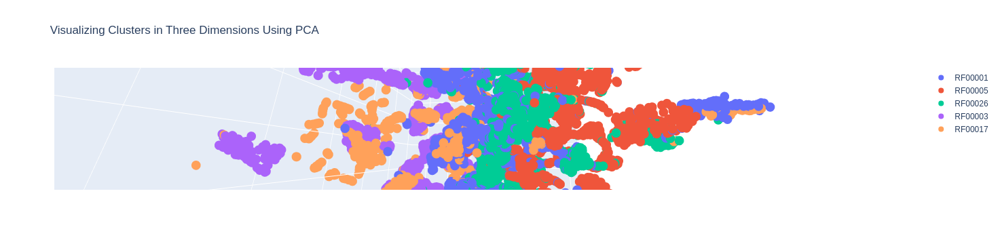

In [44]:
data = []
for group in groups:
    tcs = TCs_3d[[i for i, x in enumerate(ids) if x == group]]
    X = [i[0] for i in tcs]
    Y = [i[1] for i in tcs]
    Z = [i[2] for i in tcs]
    trace = go.Scatter3d(x = X, y = Y, z = Z, mode = "markers", name = group, text = None)
    data.append(trace)
    
title = "Visualizing Clusters in Three Dimensions Using PCA"

layout = dict(title = title,
              xaxis= dict(title= 'PC1',zeroline= False),
              yaxis= dict(title= 'PC2',zeroline= False)
             )

fig = dict(data = data, layout = layout)

import plotly.io as pio
pio.renderers.default = 'jupyterlab'
iplot(fig)